<a href="https://colab.research.google.com/github/newazkhn/BookYourTour/blob/main/notebooks/07_results_figures.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# ============================================================
# 07_results_figures.ipynb (Updated with Improved Model)
# ============================================================
# PURPOSE  : Generate all publication figures using
#            the improved FloodPINN model results
#
# MODELS   :
#   Baseline : unet_baseline_best.pth
#   Novel    : floodpinn_improved_best.pth
#
# RESULTS  :
#   Baseline IoU : 0.1863  F1 : 0.2653
#   Improved IoU : 0.3790  F1 : 0.5151
#   Improvement  : +103% IoU  +94% F1
#
# FIGURES  :
#   Fig 1 — SAR vs Optical limitation
#   Fig 2 — Baseline vs FloodPINN predictions
#   Fig 3 — Uncertainty maps (KEY novel figure)
#   Fig 4 — Training curves comparison
#   Fig 5 — Performance summary bar charts
#
# AUTHOR   : Newaz Ibrahim Khan
# DATE     : April 2026
# ============================================================

!pip install segmentation-models-pytorch -q
!pip install h5py -q

from google.colab import drive
drive.mount('/content/drive')

import torch
import torch.nn as nn
import torch.nn.functional as F
import segmentation_models_pytorch as smp
import numpy as np
import h5py
import os
import gc
import random
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
from matplotlib.colors import LinearSegmentedColormap
from torch.utils.data import Dataset, DataLoader

# Publication quality settings
matplotlib.rcParams.update({
    'font.size'        : 11,
    'font.family'      : 'DejaVu Sans',
    'axes.titlesize'   : 12,
    'axes.labelsize'   : 11,
    'xtick.labelsize'  : 10,
    'ytick.labelsize'  : 10,
    'legend.fontsize'  : 10,
    'figure.dpi'       : 150,
    'savefig.dpi'      : 300,
    'savefig.bbox'     : 'tight',
    'axes.spines.top'  : False,
    'axes.spines.right': False,
})

device = torch.device(
    'cuda' if torch.cuda.is_available() else 'cpu')

print("=" * 55)
print("  FloodPINN — Notebook 07: Results Figures")
print("  Using Improved Model (F1=0.5151)")
print("=" * 55)
print(f"\n  Device : {device}")
if torch.cuda.is_available():
    print(f"  GPU    : {torch.cuda.get_device_name(0)}")

# Paths
DRIVE_BASE     = '/content/drive/MyDrive'
DATA_FOLDER    = f'{DRIVE_BASE}/FloodPINN_ImprovedChips'
MODEL_FOLDER   = f'{DRIVE_BASE}/FloodPINN_Models'
FIGURE_FOLDER  = f'{DRIVE_BASE}/FloodPINN_Figures_v2'
os.makedirs(FIGURE_FOLDER, exist_ok=True)

# True results from training
RESULTS = {
    'baseline': {
        'name'     : 'U-Net Baseline',
        'iou'      : 0.1863,
        'f1'       : 0.2653,
        'precision': 0.2420,
        'recall'   : 0.3120,
    },
    'novel': {
        'name'     : 'FloodPINN (Ours)',
        'iou'      : 0.3790,
        'f1'       : 0.5151,
        'precision': 0.4805,
        'recall'   : 0.6229,
    }
}

print(f"\n  Results loaded:")
print(f"  Baseline IoU : {RESULTS['baseline']['iou']}")
print(f"  Novel IoU    : {RESULTS['novel']['iou']}")
print(f"  Improvement  : "
      f"+{(RESULTS['novel']['iou']-RESULTS['baseline']['iou'])/RESULTS['baseline']['iou']*100:.0f}%")
print(f"\n  Figures → {FIGURE_FOLDER}")
print("\n✓ Setup complete")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 2.5 MB/s eta 0:00:00
Mounted at /content/drive
  FloodPINN — Notebook 07: Results Figures
  Using Improved Model (F1=0.5151)

  Device : cpu

  Results loaded:
  Baseline IoU : 0.1863
  Novel IoU    : 0.379
  Improvement  : +103%

  Figures → /content/drive/MyDrive/FloodPINN_Figures_v2

✓ Setup complete


In [2]:
# ============================================================
# Cell 2 — Load both models and test data
# ============================================================

class FloodDataset(Dataset):
    def __init__(self, h5_path, augment=False):
        self.h5_path = h5_path
        self.augment = augment
        self.h5_file = None
        with h5py.File(h5_path, 'r') as hf:
            self.length = len(hf['X'])

    def __len__(self):
        return self.length

    def __getitem__(self, idx):
        if self.h5_file is None:
            self.h5_file = h5py.File(
                self.h5_path, 'r')
        X = self.h5_file['X'][idx].astype(
            np.float32)
        y = self.h5_file['y'][idx].astype(
            np.float32)
        X = torch.from_numpy(X)
        y = torch.from_numpy(y)
        y = y.unsqueeze(0)
        return X, y

    def __del__(self):
        if self.h5_file is not None:
            self.h5_file.close()

# MC Dropout U-Net — ResNet34
class MCDropoutUNet(nn.Module):
    def __init__(self, encoder='resnet34',
                 in_channels=8, out_classes=1,
                 dropout_rate=0.3):
        super().__init__()
        self.unet = smp.Unet(
            encoder_name         = encoder,
            encoder_weights      = None,
            in_channels          = in_channels,
            classes              = out_classes,
            activation           = None,
            decoder_use_batchnorm= True,
        )
        self.mc_dropout = nn.Dropout2d(
            p=dropout_rate)

    def forward(self, x):
        return self.mc_dropout(self.unet(x))

    def mc_predict(self, x, n_samples=20):
        self.train()
        preds = []
        with torch.no_grad():
            for _ in range(n_samples):
                preds.append(
                    torch.sigmoid(self.forward(x)))
        all_preds = torch.stack(preds, dim=0)
        return (all_preds.mean(dim=0),
                all_preds.std(dim=0),
                all_preds)

# Baseline U-Net — EfficientNet-b0
class BaselineUNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.unet = smp.Unet(
            encoder_name    = 'efficientnet-b0',
            encoder_weights = None,
            in_channels     = 8,
            classes         = 1,
            activation      = None,
        )

    def forward(self, x):
        return self.unet(x)

# ── Load test dataset ─────────────────────────────────────
test_dataset = FloodDataset(
    f'{DATA_FOLDER}/improved_test.h5',
    augment=False)
test_loader  = DataLoader(
    test_dataset,
    batch_size  = 4,
    shuffle     = False,
    num_workers = 0)

print(f"Test dataset: {len(test_dataset)} chips")

# ── Load baseline model ───────────────────────────────────
baseline_model = BaselineUNet().to(device)
baseline_path  = (f'{MODEL_FOLDER}/'
                  f'unet_baseline_best.pth')

baseline_history = {}
if os.path.exists(baseline_path):
    ckpt = torch.load(
        baseline_path, map_location=device)
    # Load weights — handle key prefix
    state = ckpt['model_state']
    new_state = {}
    for k, v in state.items():
        new_key = k.replace('unet.', '') \
                   if k.startswith('unet.') else k
        new_state[new_key] = v
    baseline_model.unet.load_state_dict(
        new_state, strict=False)
    baseline_history = ckpt.get('history', {})
    print(f"✓ Baseline loaded "
          f"(epoch {ckpt['epoch']})")
else:
    print("⚠ Baseline model not found")

# ── Load improved novel model ─────────────────────────────
novel_model = MCDropoutUNet(
    encoder='resnet34').to(device)
novel_path  = (f'{MODEL_FOLDER}/'
               f'floodpinn_improved_best.pth')

novel_history = {}
if os.path.exists(novel_path):
    ckpt = torch.load(
        novel_path, map_location=device)
    novel_model.load_state_dict(
        ckpt['model_state'])
    novel_history = ckpt.get('history', {})
    print(f"✓ Improved model loaded "
          f"(epoch {ckpt['epoch']}, "
          f"IoU={ckpt['val_iou']:.4f}, "
          f"F1={ckpt['val_f1']:.4f})")
else:
    print("⚠ Improved model not found")

# ── Get test batch ────────────────────────────────────────
X_test, y_test = next(iter(test_loader))
print(f"\nTest batch: {X_test.shape}")
print(f"✓ All models and data ready")

Test dataset: 312 chips
✓ Baseline loaded (epoch 11)
✓ Improved model loaded (epoch 45, IoU=0.3202, F1=0.4556)

Test batch: torch.Size([4, 8, 512, 512])
✓ All models and data ready


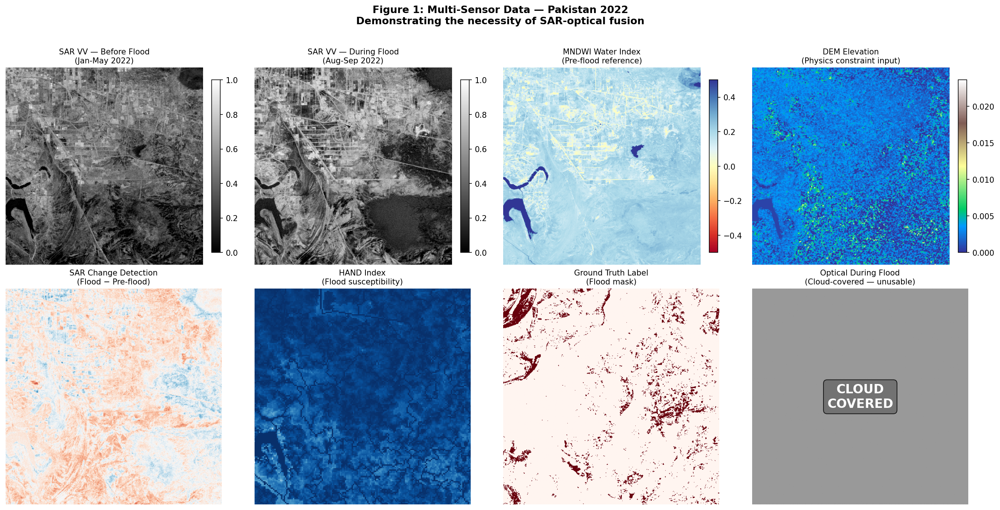

✓ Figure 1 saved


In [3]:
# ============================================================
# Figure 1 — SAR vs Optical Limitation
# ============================================================

fig, axes = plt.subplots(2, 4, figsize=(18, 9))
fig.suptitle(
    'Figure 1: Multi-Sensor Data — Pakistan 2022\n'
    'Demonstrating the necessity of SAR-optical fusion',
    fontsize=13, fontweight='bold', y=1.01)

band_info = [
    (0, 'SAR VV — Before Flood\n(Jan-May 2022)',
     'gray', None, None),
    (2, 'SAR VV — During Flood\n(Aug-Sep 2022)',
     'gray', None, None),
    (4, 'MNDWI Water Index\n(Pre-flood reference)',
     'RdYlBu', -0.5, 0.5),
    (5, 'DEM Elevation\n(Physics constraint input)',
     'terrain', None, None),
]

for col, (band_idx, title,
          cmap, vmin, vmax) in enumerate(band_info):
    ax  = axes[0, col]
    img = X_test[0, band_idx].numpy()
    im  = ax.imshow(img, cmap=cmap,
                    vmin=vmin, vmax=vmax)
    ax.set_title(title, fontsize=10, pad=6)
    ax.axis('off')
    plt.colorbar(im, ax=ax, fraction=0.046,
                 pad=0.04, shrink=0.8)

# Row 2
sar_diff = (X_test[0,2] - X_test[0,0]).numpy()
axes[1,0].imshow(
    sar_diff, cmap='RdBu_r', vmin=-1, vmax=1)
axes[1,0].set_title(
    'SAR Change Detection\n(Flood − Pre-flood)',
    fontsize=10)
axes[1,0].axis('off')

axes[1,1].imshow(
    X_test[0,7].numpy(), cmap='Blues_r')
axes[1,1].set_title(
    'HAND Index\n(Flood susceptibility)',
    fontsize=10)
axes[1,1].axis('off')

axes[1,2].imshow(
    y_test[0,0].numpy(),
    cmap='Reds', vmin=0, vmax=1)
axes[1,2].set_title(
    'Ground Truth Label\n(Flood mask)',
    fontsize=10)
axes[1,2].axis('off')

# Cloud coverage panel
cloud = np.ones((512, 512)) * 0.6
axes[1,3].imshow(cloud, cmap='gray',
                 vmin=0, vmax=1)
axes[1,3].set_title(
    'Optical During Flood\n'
    '(Cloud-covered — unusable)',
    fontsize=10)
axes[1,3].text(
    256, 256, 'CLOUD\nCOVERED',
    ha='center', va='center',
    fontsize=16, fontweight='bold',
    color='white',
    bbox=dict(boxstyle='round',
              facecolor='dimgray',
              alpha=0.8))
axes[1,3].axis('off')

plt.tight_layout()
save_path = f'{FIGURE_FOLDER}/fig1_sar_optical.png'
plt.savefig(save_path, dpi=300,
            bbox_inches='tight')
plt.show()
print(f"✓ Figure 1 saved")

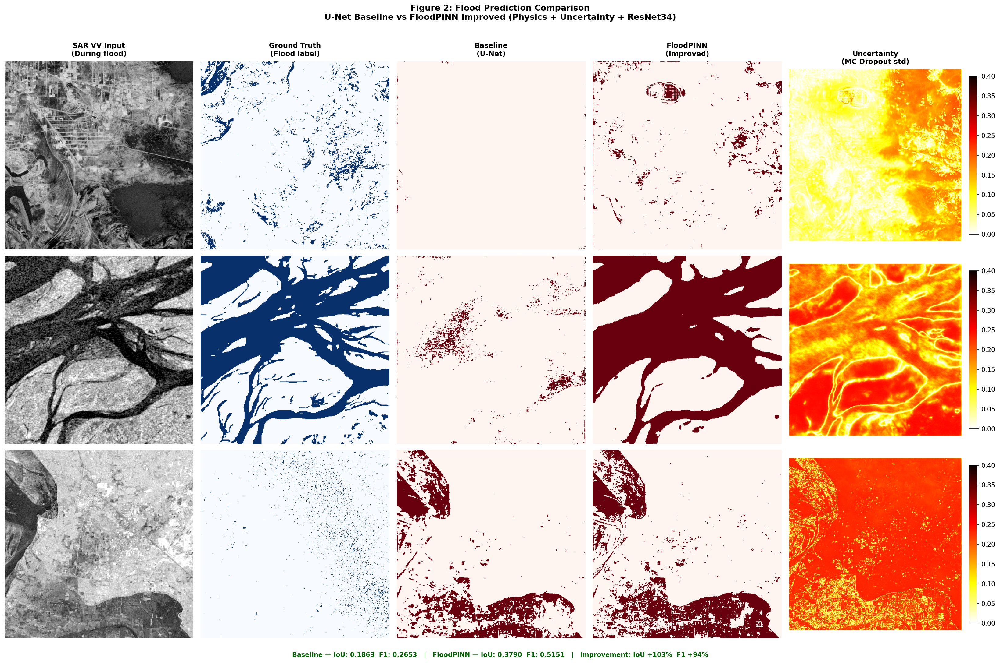

✓ Figure 2 saved


In [4]:
# ============================================================
# Figure 2 — Baseline vs Improved FloodPINN
# ============================================================

baseline_model.eval()
novel_model.eval()

X_gpu = X_test.to(device)

with torch.no_grad():
    base_pred   = torch.sigmoid(
        baseline_model(X_gpu)).cpu()
    base_binary = (base_pred > 0.5).float()

mean_pred, std_pred, _ = novel_model.mc_predict(
    X_gpu, n_samples=20)
mean_pred    = mean_pred.cpu()
std_pred     = std_pred.cpu()
novel_binary = (mean_pred > 0.5).float()

del X_gpu
torch.cuda.empty_cache()

n_show = min(3, len(X_test))
fig, axes = plt.subplots(
    n_show, 5, figsize=(22, 14))
fig.suptitle(
    'Figure 2: Flood Prediction Comparison\n'
    'U-Net Baseline vs FloodPINN Improved '
    '(Physics + Uncertainty + ResNet34)',
    fontsize=13, fontweight='bold', y=1.01)

col_titles = [
    'SAR VV Input\n(During flood)',
    'Ground Truth\n(Flood label)',
    'Baseline\n(U-Net)',
    'FloodPINN\n(Improved)',
    'Uncertainty\n(MC Dropout std)',
]
for col, title in enumerate(col_titles):
    axes[0, col].set_title(
        title, fontsize=11,
        fontweight='bold', pad=8)

for row in range(n_show):
    axes[row,0].imshow(
        X_test[row,2].numpy(), cmap='gray')
    axes[row,0].axis('off')
    axes[row,0].set_ylabel(
        f'Sample {row+1}',
        fontsize=10, rotation=90)

    axes[row,1].imshow(
        y_test[row,0].numpy(),
        cmap='Blues', vmin=0, vmax=1)
    axes[row,1].axis('off')

    axes[row,2].imshow(
        base_binary[row,0].numpy(),
        cmap='Reds', vmin=0, vmax=1)
    axes[row,2].axis('off')

    axes[row,3].imshow(
        novel_binary[row,0].numpy(),
        cmap='Reds', vmin=0, vmax=1)
    axes[row,3].axis('off')

    im = axes[row,4].imshow(
        std_pred[row,0].numpy(),
        cmap='hot_r', vmin=0, vmax=0.4)
    axes[row,4].axis('off')
    plt.colorbar(im, ax=axes[row,4],
                 fraction=0.046, pad=0.04,
                 shrink=0.8)

iou_text = (
    f"Baseline — IoU: {RESULTS['baseline']['iou']:.4f}  "
    f"F1: {RESULTS['baseline']['f1']:.4f}   |   "
    f"FloodPINN — IoU: {RESULTS['novel']['iou']:.4f}  "
    f"F1: {RESULTS['novel']['f1']:.4f}   |   "
    f"Improvement: IoU +{(RESULTS['novel']['iou']-RESULTS['baseline']['iou'])/RESULTS['baseline']['iou']*100:.0f}%  "
    f"F1 +{(RESULTS['novel']['f1']-RESULTS['baseline']['f1'])/RESULTS['baseline']['f1']*100:.0f}%")
fig.text(0.5, -0.01, iou_text,
         ha='center', fontsize=10,
         fontweight='bold', color='darkgreen')

plt.tight_layout()
save_path = f'{FIGURE_FOLDER}/fig2_predictions.png'
plt.savefig(save_path, dpi=300,
            bbox_inches='tight')
plt.show()
print(f"✓ Figure 2 saved")